
------------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------------

# Ninjacart: CV Classification
-------------------------------------------------------------------------------------------------------------------------------
-------------------------------------------------------------------------------------------------------------------------------



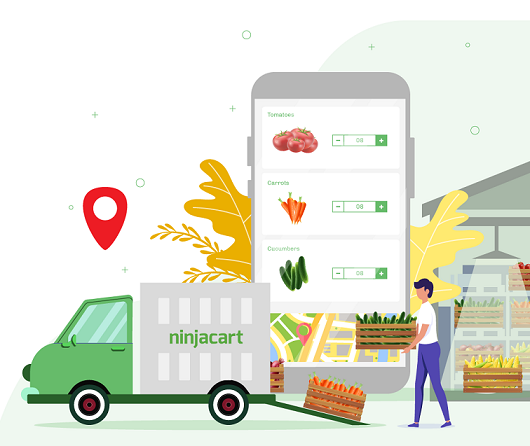



# Defining Problem Statement & import data

## Problem Statement


- Ninjacart is India's largest fresh produce supply chain company. They are pioneers in solving one of the toughest supply chain problems of the world by leveraging innovative technology. They source fresh produce from farmers and deliver them to businesses within 12 hours. An integral component of their automation process is the development of robust classifiers which can distinguish between images of different types of vegetables, while also correctly labeling images that do not contain any one type of vegetable as noise.
- As a starting point, ninjacart has provided us with a dataset scraped from the web which contains train and test folders, each having 4 sub-folders with images of onions, potatoes, tomatoes and some market scenes. We have been tasked with preparing a multiclass classifier for identifying these vegetables. The dataset provided has all the required images to achieve the task.



## Datasets

Dataset Link: https://drive.google.com/file/d/1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT/view?usp=sharing


## Context
This dataset contains images of the following food items: noise-Indian market and images of vegetables- onion, potato and tomato.

## Data Collection
The images in this dataset were scraped from Google.

## Content
This dataset contains a folder train, which has a total of 3135 images, split into four folders as follows:
- Tomato : 789
- Potato : 898
- Onion : 849
- Indian market : 599

This dataset contains another folder test which has a total of 351 images, split into four folders
- Tomato : 106
- potato : 83
- onion : 81
- Indian market : 81

## Inspiration
The objective is to develop a program that can recognize the vegetable item(s) in a photo and identify them for the user.

-------------------------------------------------------------------------------------------------------------------------------
-------------------------------------------------------------------------------------------------------------------------------


# Approach to case study Solution


- Importing the libraries & Download the Data (unzipping)
- Checking class imabalance, Data Visualization & checking image dimensions
- Splitting data in Train, Validation & Test.
- Reshaping image size, rescale pixel values & data augmentation before training model
- Train various models using Keras libraries & track model metrics (Accuracy, Precision, Recall, Confusion Matrix):
    - Training Custom model
    - Training Fine Tuned Model
    - Training using pretrained VGG19 Network weights
    - Training using pretrained ResNet Network weights
    - Training using pretrained MobileNet Network weights
- Finalize the best performing model
- Insights and conclusion


-------------------------------------------------------------------------------------------------------------------------------
-------------------------------------------------------------------------------------------------------------------------------



# Importing Libraries & Download Data

In [1]:
#for reading and handling the data
import pandas as pd
import numpy as np
import os
pd.set_option('display.max_columns', None)
pd.options.display.max_colwidth = 100
import random
from PIL import Image

#for visualizing and analyzing it
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style = 'darkgrid')

# supress warnings
import warnings
warnings.filterwarnings('ignore')

#Ann training
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model
from tensorflow.keras import metrics
print(f'TensorFlow Version: {tf. __version__}')


#Pretrained Models
from tensorflow.keras.applications import VGG19

from sklearn.metrics import confusion_matrix



TensorFlow Version: 2.12.0


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

#Code to Unzip Data
#zip_path = '/content/drive/MyDrive/ScalerData/ninjacart_data.zip'
#!unzip '/content/drive/MyDrive/ScalerData/ninjacart_data.zip' -d '/content/drive/MyDrive/ScalerData/ninjacart_data'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
train_folder_path = '/content/drive/MyDrive/ScalerData/ninjacart_data/ninjacart_data/train'
test_folder_path = '/content/drive/MyDrive/ScalerData/ninjacart_data/ninjacart_data/test'

# Checking class imabalance

In [ ]:
# Function for Image distribution Analysis
def count_images_in_subfolders(main_folder):
    subfolder_count = 0
    image_counts = {}

    for root, dirs, files in os.walk(main_folder):
        for directory in dirs:
            subfolder_count += 1
            subfolder_path = os.path.join(root, directory)
            image_counts[directory] = len([file for file in os.listdir(subfolder_path) if file.lower().endswith(('.jpg', '.jpeg', '.png', '.gif'))])

    return subfolder_count, image_counts

def plot_barchart(image_counts):
    keys = list(image_counts.keys())
    values = list(image_counts.values())

    plt.bar(keys, values)
    plt.xlabel('Image')
    plt.ylabel('Count')
    plt.title('Image Counts')
    for i, v in enumerate(values):
        plt.text(keys[i], v, v, ha="center", va="bottom")
    plt.show()

--------------------------------------------------
Train dataset categories: 4
--------------------------------------------------
potato: 898 images
onion: 849 images
tomato: 789 images
indian market: 599 images
--------------------------------------------------


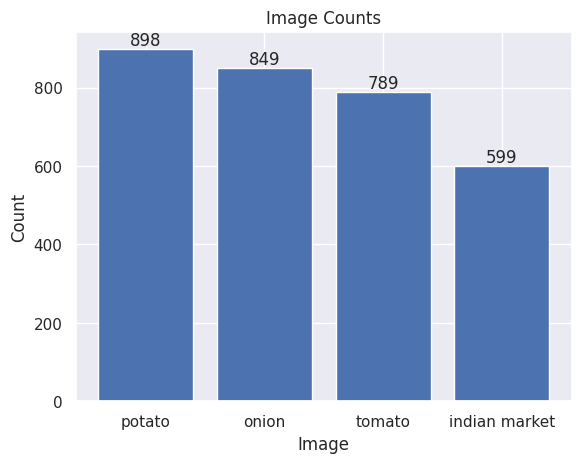

--------------------------------------------------


In [ ]:
#Class distribution in Training Dataset

subfolder_count, image_counts = count_images_in_subfolders(train_folder_path)
print("-"*50)
print(f"Train dataset categories: {subfolder_count}")
print("-"*50)
for subfolder, count in image_counts.items():
    print(f"{subfolder}: {count} images")
print("-"*50)

plot_barchart(image_counts)
print("-"*50)

--------------------------------------------------
Test dataset categories: 4
--------------------------------------------------
indian market: 81 images
onion: 83 images
potato: 81 images
tomato: 106 images
--------------------------------------------------


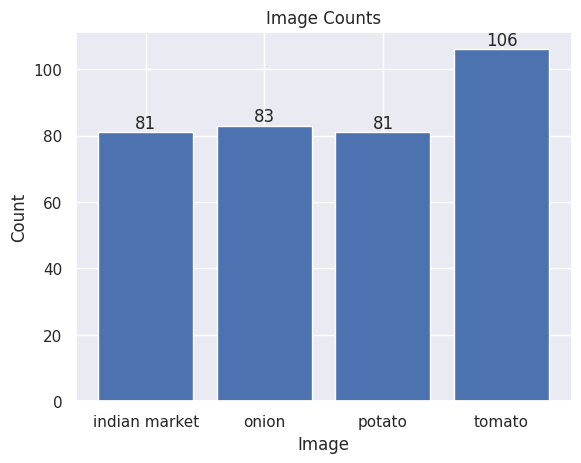

--------------------------------------------------


In [ ]:
#Class distribution in Test Dataset
subfolder_count, image_counts = count_images_in_subfolders(test_folder_path)
print("-"*50)
print(f"Test dataset categories: {subfolder_count}")
print("-"*50)
for subfolder, count in image_counts.items():
    print(f"{subfolder}: {count} images")
print("-"*50)

plot_barchart(image_counts)
print("-"*50)

# Image Visualization & checking image dimensions

In [ ]:
#Creating functions to visualize images from Folders & Dimension Analysis

def load_images_from_folder(folder):
    image_files = []
    for filename in os.listdir(folder):
        if any(filename.lower().endswith(ext) for ext in ['.jpg', '.jpeg', '.png', '.gif']):
            image_files.append(os.path.join(folder, filename))
    return image_files

def display_images_in_grid(image_files, folder_name, grid_size=(1, 5)):
    random.shuffle(image_files)
    num_images = grid_size[0] * grid_size[1]
    selected_images = image_files[:num_images]

    fig = plt.figure(figsize=(12, 2))
    fig.suptitle(folder_name, fontsize=14)

    for i, image_path in enumerate(selected_images):
        img = Image.open(image_path)
        img_width, img_height = img.size
        ax = fig.add_subplot(grid_size[0], grid_size[1], i + 1)
        # Print image dimensions
        ax.set_title(f"Dimension: {img_width} x {img_height}", fontsize=8)
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()


--------------------------------------------------
Images from Train Dataset
--------------------------------------------------


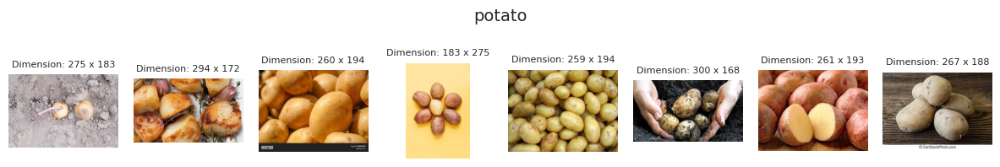

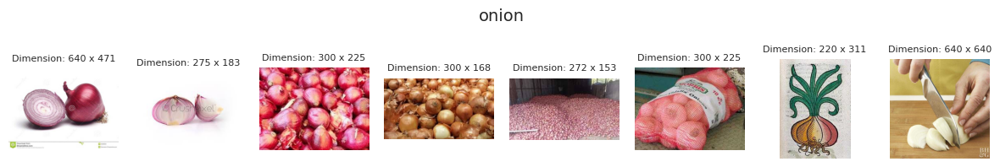

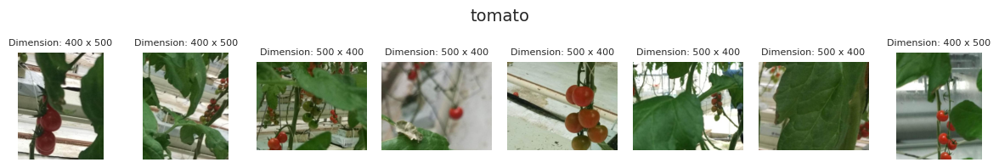

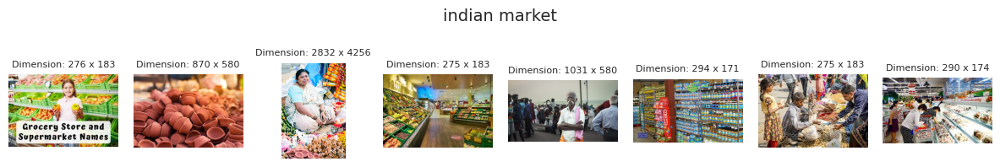

--------------------------------------------------


In [ ]:
#Visualizing Images from Train Dataset
print("-"*50)
print(f"Images from Train Dataset")
print("-"*50)


for folder_name in os.listdir(train_folder_path):
    folder_path = os.path.join(train_folder_path, folder_name)
    image_files = load_images_from_folder(folder_path)
    display_images_in_grid(image_files, folder_name, grid_size=(1, 8))

print("-"*50)


--------------------------------------------------
Images from Test Dataset
--------------------------------------------------


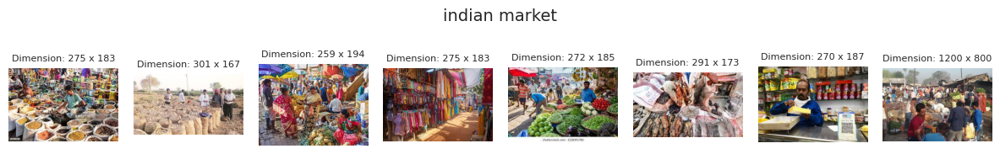

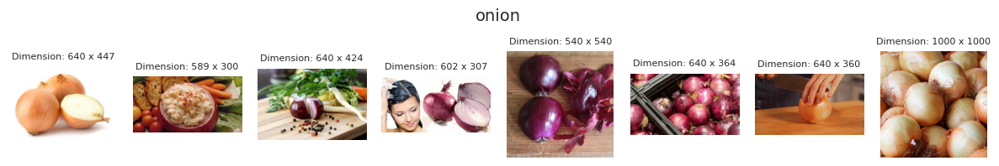

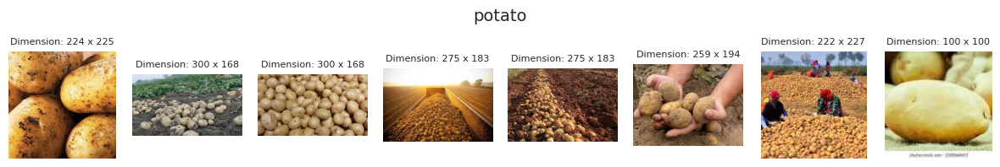

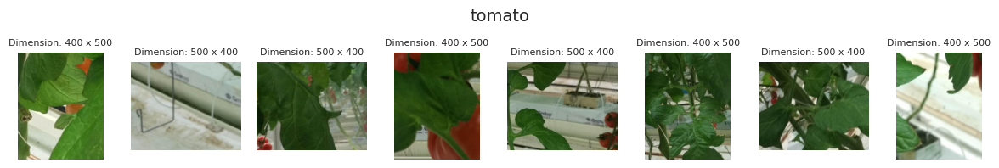

In [ ]:
#Visualizing Images from Test Dataset
print("-"*50)
print(f"Images from Test Dataset")
print("-"*50)


for folder_name in os.listdir(test_folder_path):
    folder_path = os.path.join(test_folder_path, folder_name)
    image_files = load_images_from_folder(folder_path)
    display_images_in_grid(image_files, folder_name, grid_size=(1, 8))

# Splitting data in Train, Validation & Test

In [2]:
#Resize all images to common image size : 256 x 256
image_size = (256,256)


In [16]:
# Create the image Train dataset, Validation dataset & Test Dataset
print("-"*50)
print('Creating Train Dataset')
print("-"*50)
train_dataset = tf.keras.utils.image_dataset_from_directory( train_folder_path, label_mode='categorical',
                                                            image_size=image_size, batch_size=32, shuffle=True, seed=23,
                                                            validation_split=0.2, subset='training')

train_class_names = train_dataset.class_names
print("Class names:", train_class_names)
print("-"*50)

print('Creating Validation Dataset')
print("-"*50)

val_dataset = tf.keras.utils.image_dataset_from_directory( train_folder_path, label_mode='categorical',
                                                            image_size=image_size, batch_size=32, shuffle=True, seed=23,
                                                            validation_split=0.2, subset='validation')

val_class_names = val_dataset.class_names
print("Class names:", val_class_names)
print("-"*50)

print('Creating Test Dataset')
print("-"*50)

test_dataset = tf.keras.utils.image_dataset_from_directory( test_folder_path, label_mode='categorical',
                                                            image_size=image_size, batch_size=32)

test_class_names = test_dataset.class_names
print("Class names:", test_class_names)
print("-"*50)


--------------------------------------------------
Creating Train Dataset
--------------------------------------------------
Found 3135 files belonging to 4 classes.
Using 2508 files for training.
Class names: ['indian market', 'onion', 'potato', 'tomato']
--------------------------------------------------
Creating Validation Dataset
--------------------------------------------------
Found 3135 files belonging to 4 classes.
Using 627 files for validation.
Class names: ['indian market', 'onion', 'potato', 'tomato']
--------------------------------------------------
Creating Test Dataset
--------------------------------------------------
Found 351 files belonging to 4 classes.
Class names: ['indian market', 'onion', 'potato', 'tomato']
--------------------------------------------------


# Training Custom CNN model

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Rescaling(1./255, input_shape=(image_size[0], image_size[1], 3)),

    tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu'),
    tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),

    tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
    tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),

    tf.keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu'),
    tf.keras.layers.GlobalAveragePooling2D(),

    tf.keras.layers.Dense(4, activation='softmax')
])

# Print the model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 256, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 32)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 128, 128, 64)      18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 128, 128, 64)      36928     
                                                        

In [ ]:
# Compile & Fit the model
checkpoint = tf.keras.callbacks.ModelCheckpoint("CustomCNN_best.h5", save_best_only = True)
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=4, restore_best_weights = True )

adam_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=adam_optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy', 'Precision', 'Recall'])

In [ ]:
# Fitting the Model : Long Time to execute
model_history = model.fit(train_dataset, validation_data=val_dataset,
                          epochs=20, verbose=1,
                          callbacks=[early_stop, checkpoint])

Epoch 1/20
79/79 [==============================] - 656s 7s/step - loss: 1.3179 - accuracy: 0.3433 - precision: 1.0000 - recall: 0.0024 - val_loss: 1.1705 - val_accuracy: 0.5997 - val_precision: 1.0000 - val_recall: 0.0223
Epoch 2/20
79/79 [==============================] - 17s 201ms/step - loss: 0.9111 - accuracy: 0.6631 - precision: 0.8156 - recall: 0.3720 - val_loss: 0.8015 - val_accuracy: 0.6651 - val_precision: 0.7552 - val_recall: 0.5215
Epoch 3/20
79/79 [==============================] - 17s 204ms/step - loss: 0.7300 - accuracy: 0.7237 - precision: 0.8003 - recall: 0.6057 - val_loss: 0.7016 - val_accuracy: 0.7321 - val_precision: 0.8089 - val_recall: 0.6411
Epoch 4/20
79/79 [==============================] - 17s 200ms/step - loss: 0.6879 - accuracy: 0.7364 - precision: 0.7928 - recall: 0.6439 - val_loss: 0.7116 - val_accuracy: 0.7257 - val_precision: 0.7763 - val_recall: 0.6475
Epoch 5/20
79/79 [==============================] - 17s 201ms/step - loss: 0.6566 - accuracy: 0.7480 -

In [ ]:
# Plot the Loss & other Metrics w.r.t. epochs

def plot_history(history):
    plt.figure(figsize=(30,5))
    metrics = ['loss', 'accuracy', 'precision', 'recall']
    for index, key in enumerate(metrics):
        plt.subplot(1,len(metrics),index+1)
        plt.plot(history.history[key])
        plt.plot(history.history['val_'+key])
        plt.xlabel("Epochs")
        plt.ylabel(key)
        plt.legend([key, 'val_'+key])
    plt.show()

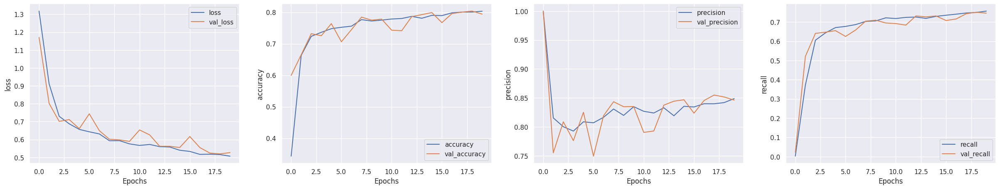

In [ ]:
plot_history(model_history)

In [ ]:
#Code to save current weights in h5 format for later use
#model.save_weights("CustomCNN_best.h5")


In [ ]:
#Code to use previously saved weights from h5 format
model.load_weights("CustomCNN_best.h5")

In [ ]:
#Creating List with all Test Images location
test_images = []
for folder in os.listdir(test_folder_path):
    for image in os.listdir(test_folder_path + '/'+ folder):
        test_images.append(os.path.join(test_folder_path,folder, image))


# Set the paths and class labels
test_folder, class_labels = test_folder_path, test_class_names


----------------------------------------------------------------------------------------------------
Predicting Labels for images from Test Dataset with their respective Class Label Probabilities
----------------------------------------------------------------------------------------------------


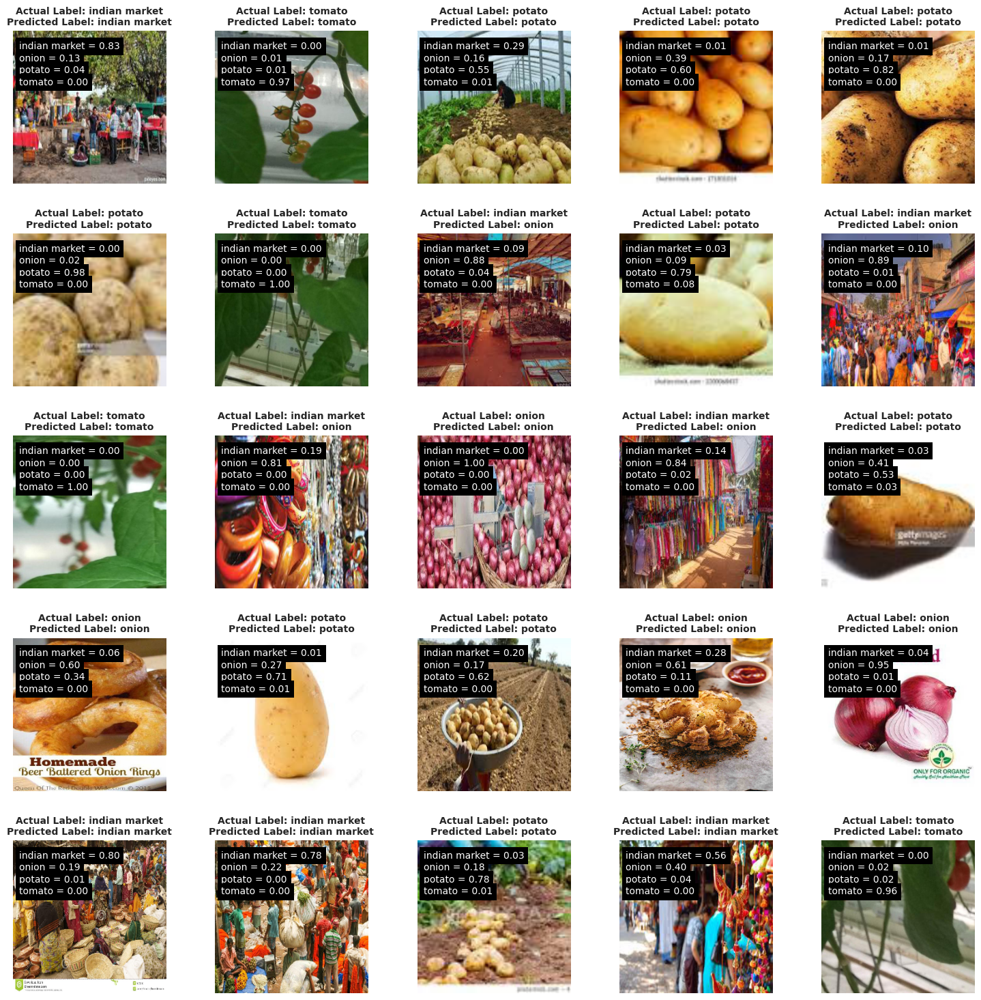

In [ ]:
# Create a figure for the grid display of Model Prediction

print("-"*100)
print('Predicting Labels for images from Test Dataset with their respective Class Label Probabilities')
print("-"*100)


fig, axes = plt.subplots(5, 5, figsize=(15, 15))
fig.tight_layout()
for i in range(25):
    x = np.random.randint(len(test_images))
    actual_label = test_images[x].split('/')[-2]

    img_0 = tf.keras.utils.load_img(test_images[x])
    img_0 = tf.keras.utils.img_to_array(img_0)
    img_0 = tf.image.resize(img_0, (256,256))
    img_1 = tf.expand_dims(img_0, axis = 0)

    predictions = model.predict(img_1, verbose=0)
    predicted_label_index = np.argmax(predictions)
    predicted_label = class_labels[predicted_label_index]
    probabilities = predictions[0].round(3)

    # Display the image and predicted label with probabilities
    ax = axes[i % 5, i // 5]
    ax.imshow(img_0/255.0)
    ax.set_title('Actual Label: {}\nPredicted Label: {}'.format(actual_label, predicted_label),
                 fontsize = 10, fontweight = 'bold')
    ax.axis('off')

    # Display the probabilities as text
    for k, (class_label, probability) in enumerate(zip(class_labels, probabilities)):
        text = '{} = {:.2f}'.format(class_label, probability)
        ax.text(10, 30 + k*20, text, color='white', fontsize=10, bbox=dict(facecolor='black', edgecolor='none'))

plt.show()

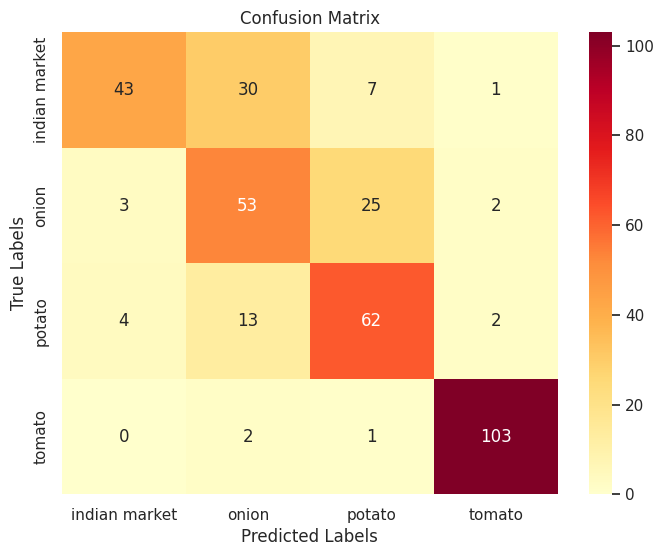

In [ ]:
#Confusion Matrix for Custom CNN Model
def plot_confusionmatrix(test_images, model):
    actual_labels = []
    predicted_labels = []
    for x in range(len(test_images)):
        actual_label = test_images[x].split('/')[-2]
        actual_labels.append(actual_label)

        img_0 = tf.keras.utils.load_img(test_images[x])
        img_0 = tf.keras.utils.img_to_array(img_0)
        img_0 = tf.image.resize(img_0, image_size)
        img_1 = tf.expand_dims(img_0, axis = 0)

        predictions = model.predict(img_1, verbose=0)
        predicted_label_index = np.argmax(predictions)
        predicted_label = class_labels[predicted_label_index]
        predicted_labels.append(predicted_label)

    confusion_mat = confusion_matrix(actual_labels, predicted_labels)
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_mat.round(), annot=True, cmap = 'YlOrRd',
                xticklabels=class_labels, yticklabels=class_labels, fmt='.0f')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()
    return (actual_labels, predicted_labels, confusion_mat)




actual_labels, predicted_labels, confusion_mat = plot_confusionmatrix(test_images, model)

In [ ]:
# Loss & Other Metrics from Test Dataset evaluation
result = model.evaluate(test_dataset)
dict(zip(model.metrics_names,np.round(result,3)))

11/11 [==============================] - 3s 221ms/step - loss: 0.5681 - accuracy: 0.7436 - precision: 0.7666 - recall: 0.6923


{'loss': 0.568, 'accuracy': 0.744, 'precision': 0.767, 'recall': 0.692}

# Training Fine Tuned Model

In [ ]:
#Improving Baseline CNN to reduce overfitting
#Adding Batch Normalization and Dropouts to existing Model

model_revamp = tf.keras.Sequential([
    tf.keras.layers.Rescaling(1./255, input_shape=(image_size[0], image_size[1], 3)),

    tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu'),
    tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)),

    tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
    tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)),

    tf.keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(rate = 0.2),

    tf.keras.layers.Dense(4, activation='softmax')
])

# Print the model summary
model_revamp.summary()



Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 conv2d_5 (Conv2D)           (None, 256, 256, 32)      896       
                                                                 
 conv2d_6 (Conv2D)           (None, 256, 256, 32)      9248      
                                                                 
 batch_normalization (BatchN  (None, 256, 256, 32)     128       
 ormalization)                                                   
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 128, 128, 32)     0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 128, 128, 64)     

In [ ]:
# Compile & Fit the model
checkpoint = tf.keras.callbacks.ModelCheckpoint("CustomCNN_revamp_best.h5", save_best_only = True)
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=5, restore_best_weights = True )

adam_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
model_revamp.compile(optimizer=adam_optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy', 'Precision', 'Recall'])

In [ ]:
# Fitting the Model : Long Time to execute
model_revamp_history = model_revamp.fit(train_dataset, validation_data=val_dataset,
                          epochs=20, verbose=1,
                          callbacks=[early_stop, checkpoint])

Epoch 1/20
79/79 [==============================] - 45s 202ms/step - loss: 0.5238 - accuracy: 0.8046 - precision: 0.8535 - recall: 0.7480 - val_loss: 1.4727 - val_accuracy: 0.3110 - val_precision: 0.6357 - val_recall: 0.2616
Epoch 2/20
79/79 [==============================] - 19s 223ms/step - loss: 0.4808 - accuracy: 0.8230 - precision: 0.8739 - recall: 0.7791 - val_loss: 1.7206 - val_accuracy: 0.2648 - val_precision: 0.2721 - val_recall: 0.2648
Epoch 3/20
79/79 [==============================] - 17s 204ms/step - loss: 0.4220 - accuracy: 0.8453 - precision: 0.8859 - recall: 0.8050 - val_loss: 1.9810 - val_accuracy: 0.2823 - val_precision: 0.2826 - val_recall: 0.2727
Epoch 4/20
79/79 [==============================] - 20s 229ms/step - loss: 0.4098 - accuracy: 0.8537 - precision: 0.8833 - recall: 0.8090 - val_loss: 2.1246 - val_accuracy: 0.3142 - val_precision: 0.3333 - val_recall: 0.3094
Epoch 5/20
79/79 [==============================] - 17s 204ms/step - loss: 0.3794 - accuracy: 0.8616

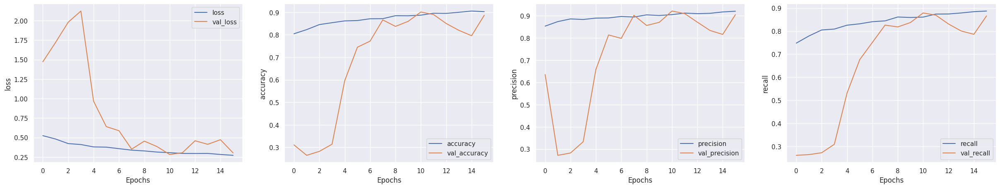

In [ ]:
plot_history(model_revamp_history)

In [ ]:
#Code to save current weights in h5 format for later use
#model_revamp.save_weights("CustomCNN_revamp_best.h5")

#Code to use previously saved weights from h5 format
#model_revamp.load_weights("CustomCNN_revamp_best.h5")


----------------------------------------------------------------------------------------------------
Predicting Labels for images from Test Dataset with their respective Class Label Probabilities
----------------------------------------------------------------------------------------------------


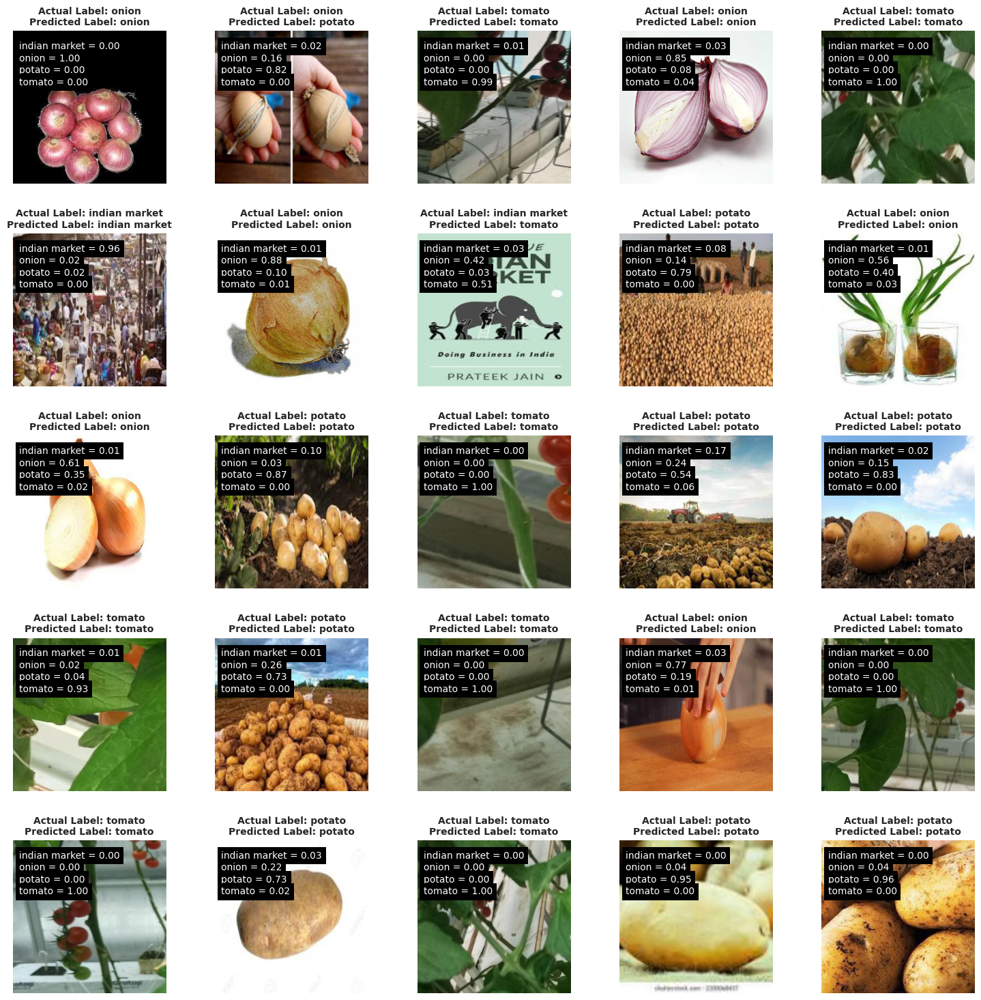

In [ ]:
# Set the paths and class labels
test_folder, class_labels = test_folder_path, test_class_names

# Create a figure for the grid display of Model Prediction

print("-"*100)
print('Predicting Labels for images from Test Dataset with their respective Class Label Probabilities')
print("-"*100)


fig, axes = plt.subplots(5, 5, figsize=(15, 15))
fig.tight_layout()
for i in range(25):
    x = np.random.randint(len(test_images))
    actual_label = test_images[x].split('/')[-2]

    img_0 = tf.keras.utils.load_img(test_images[x])
    img_0 = tf.keras.utils.img_to_array(img_0)
    img_0 = tf.image.resize(img_0, (256,256))
    img_1 = tf.expand_dims(img_0, axis = 0)

    predictions = model_revamp.predict(img_1, verbose=0)
    predicted_label_index = np.argmax(predictions)
    predicted_label = class_labels[predicted_label_index]
    probabilities = predictions[0].round(3)

    # Display the image and predicted label with probabilities
    ax = axes[i % 5, i // 5]
    ax.imshow(img_0/255.0)
    ax.set_title('Actual Label: {}\nPredicted Label: {}'.format(actual_label, predicted_label),
                 fontsize = 10, fontweight = 'bold')
    ax.axis('off')

    # Display the probabilities as text
    for k, (class_label, probability) in enumerate(zip(class_labels, probabilities)):
        text = '{} = {:.2f}'.format(class_label, probability)
        ax.text(10, 30 + k*20, text, color='white', fontsize=10, bbox=dict(facecolor='black', edgecolor='none'))

plt.show()



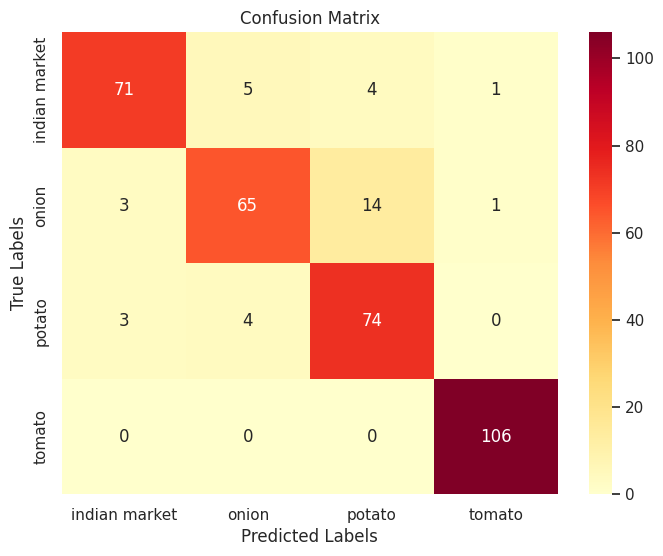

In [ ]:
actual_labels, predicted_labels, confusion_mat = plot_confusionmatrix(test_images, model_revamp)

In [ ]:
# Loss & Other Metrics from Test Dataset evaluation
result = model_revamp.evaluate(test_dataset)
dict(zip(model.metrics_names,np.round(result,3)))

11/11 [==============================] - 2s 67ms/step - loss: 0.3106 - accuracy: 0.8946 - precision: 0.9194 - recall: 0.8775


{'loss': 0.311, 'accuracy': 0.895, 'precision': 0.919, 'recall': 0.877}

**Creating Augmented Dataset for Training Pre-Trained Models like VGG, RESNET, MobileNET & EfficientNet**

In [ ]:
augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomTranslation(height_factor = 0.2, width_factor = 0.2)
])

aug_dataset = train_dataset

for image, label in aug_dataset:
    image = augmentation(image)

# Training using pretrained VGG19 Network weights

In [ ]:
#Finetune pretrained models such as VGG19

# Load the VGG19 model with pretrained weights
vgg19 = tf.keras.applications.vgg19.VGG19(weights='imagenet',
                                    include_top=False,
                                    input_shape=(image_size[0], image_size[1], 3))


In [ ]:
# Set all convolution layer weights as non-trainable
for layer in vgg19.layers:
    layer.trainable = False

# Add a custom output layer
output = tf.keras.layers.GlobalAveragePooling2D()(vgg19.output)
output = tf.keras.layers.Dropout(0.2)(output)
output = tf.keras.layers.Dense(4, activation='softmax')(output)

# Create the transfer learning model
model_vgg = tf.keras.models.Model(inputs=vgg19.input, outputs=output)


In [ ]:
model_vgg.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0   

In [ ]:
# Setting Checkpoints
checkpoint = tf.keras.callbacks.ModelCheckpoint("vgg19_best.h5", save_best_only = True)
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=5, restore_best_weights = True )

#Compile the model
adam_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
model_vgg.compile(optimizer=adam_optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy', 'Precision', 'Recall'])

In [ ]:
# Fitting the Model : Long Time to execute
history_vgg = model_vgg.fit(aug_dataset, validation_data=val_dataset,
                          epochs=40, verbose=1,
                          callbacks=[early_stop, checkpoint])

Epoch 1/40
79/79 [==============================] - 24s 275ms/step - loss: 5.4441 - accuracy: 0.3202 - precision: 0.3199 - recall: 0.3130 - val_loss: 3.8187 - val_accuracy: 0.3445 - val_precision: 0.3443 - val_recall: 0.3349
Epoch 2/40
79/79 [==============================] - 24s 296ms/step - loss: 3.8785 - accuracy: 0.3844 - precision: 0.3884 - recall: 0.3776 - val_loss: 2.5478 - val_accuracy: 0.4577 - val_precision: 0.4648 - val_recall: 0.4530
Epoch 3/40
79/79 [==============================] - 24s 292ms/step - loss: 2.7200 - accuracy: 0.4860 - precision: 0.4899 - recall: 0.4749 - val_loss: 1.8540 - val_accuracy: 0.5662 - val_precision: 0.5689 - val_recall: 0.5534
Epoch 4/40
79/79 [==============================] - 23s 281ms/step - loss: 2.0615 - accuracy: 0.5817 - precision: 0.5863 - recall: 0.5714 - val_loss: 1.4494 - val_accuracy: 0.6507 - val_precision: 0.6579 - val_recall: 0.6348
Epoch 5/40
79/79 [==============================] - 25s 286ms/step - loss: 1.6906 - accuracy: 0.6380

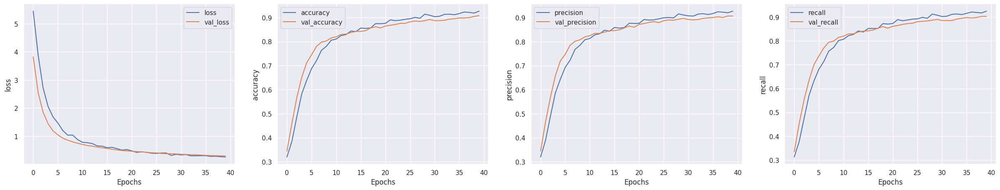

In [ ]:
plot_history(history_vgg)

In [ ]:
#Code to save current weights in h5 format for later use
#model_revamp.save_weights("vgg19_best.h5")

#Code to use previously saved weights from h5 format
#model_revamp.load_weights("vgg19_best.h5")

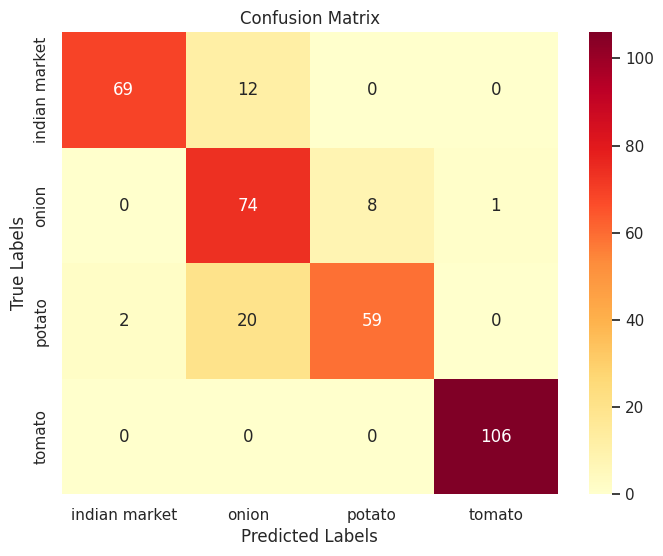

In [ ]:
actual_labels, predicted_labels, confusion_mat = plot_confusionmatrix(test_images, model_vgg)

In [ ]:
# Loss & Other Metrics from Test Dataset evaluation
result = model_vgg.evaluate(test_dataset)
dict(zip(model.metrics_names,np.round(result,3)))

11/11 [==============================] - 3s 208ms/step - loss: 0.6319 - accuracy: 0.8775 - precision: 0.8771 - recall: 0.8746


{'loss': 0.632, 'accuracy': 0.877, 'precision': 0.877, 'recall': 0.875}

# Training using pretrained ResNet Network weights

In [3]:
#Finetune pretrained models such as ResNet152

# Load the VGG19 model with pretrained weights
resnet152 = tf.keras.applications.resnet.ResNet152(weights='imagenet',
                                    include_top=False,
                                    input_shape=(image_size[0], image_size[1], 3))

234698864/234698864 [==============================] - 40s 0us/step


In [5]:
# Set all convolution layer weights as non-trainable
for layer in resnet152.layers:
    layer.trainable = False

# Add a custom output layer
output = tf.keras.layers.GlobalAveragePooling2D()(resnet152.output)
output = tf.keras.layers.Dropout(0.2)(output)
output = tf.keras.layers.Dense(4, activation='softmax')(output)

# Create the transfer learning model
model_resnet152 = tf.keras.models.Model(inputs=resnet152.input, outputs=output)


In [ ]:
model_resnet152.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_4[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

In [ ]:
# Setting Checkpoints
checkpoint = tf.keras.callbacks.ModelCheckpoint("resnet152_best.h5", save_best_only = True)
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=5, restore_best_weights = True )

#Compile the model
adam_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
model_resnet152.compile(optimizer=adam_optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy', 'Precision', 'Recall'])

In [ ]:
# Fitting the Model : Long Time to execute
history_resnet152 = model_resnet152.fit(aug_dataset, validation_data=val_dataset,
                          epochs=40, verbose=1,
                          callbacks=[early_stop, checkpoint])

Epoch 1/40
79/79 [==============================] - 55s 553ms/step - loss: 1.3132 - accuracy: 0.4741 - precision: 0.5056 - recall: 0.3425 - val_loss: 0.7111 - val_accuracy: 0.7321 - val_precision: 0.7968 - val_recall: 0.6443
Epoch 2/40
79/79 [==============================] - 38s 466ms/step - loss: 0.6057 - accuracy: 0.7779 - precision: 0.8185 - recall: 0.7121 - val_loss: 0.4366 - val_accuracy: 0.8501 - val_precision: 0.8694 - val_recall: 0.8070
Epoch 3/40
79/79 [==============================] - 36s 428ms/step - loss: 0.4137 - accuracy: 0.8537 - precision: 0.8798 - recall: 0.8170 - val_loss: 0.3332 - val_accuracy: 0.8788 - val_precision: 0.8980 - val_recall: 0.8565
Epoch 4/40
79/79 [==============================] - 35s 423ms/step - loss: 0.3241 - accuracy: 0.8776 - precision: 0.8971 - recall: 0.8549 - val_loss: 0.2740 - val_accuracy: 0.9011 - val_precision: 0.9171 - val_recall: 0.8820
Epoch 5/40
79/79 [==============================] - 34s 420ms/step - loss: 0.2613 - accuracy: 0.9015

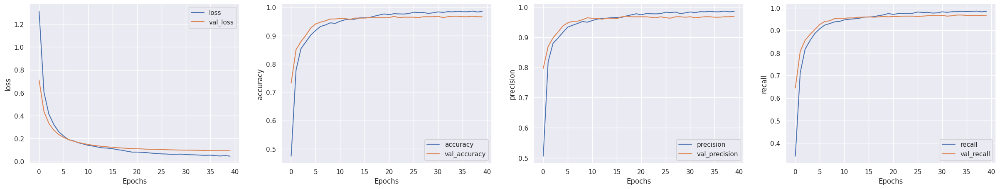

In [ ]:
plot_history(history_resnet152)

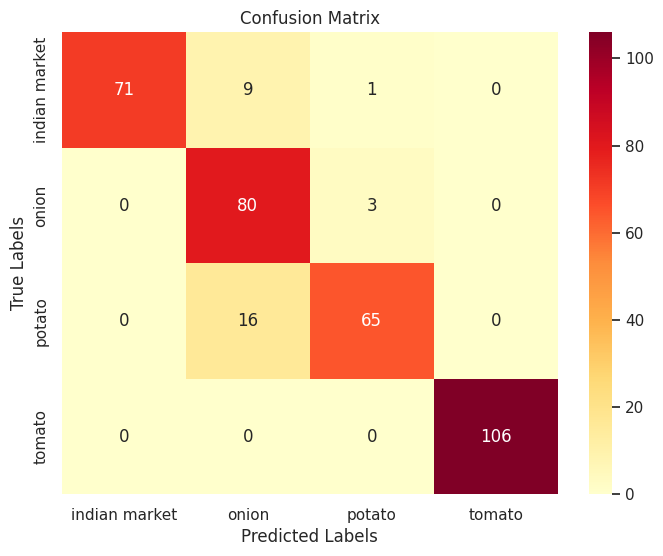

In [ ]:
actual_labels, predicted_labels, confusion_mat = plot_confusionmatrix(test_images, model_resnet152)

In [ ]:
# Loss & Other Metrics from Test Dataset evaluation
result = model_resnet152.evaluate(test_dataset)
dict(zip(model.metrics_names,np.round(result,3)))

11/11 [==============================] - 5s 416ms/step - loss: 0.3090 - accuracy: 0.9117 - precision: 0.9109 - recall: 0.9031


{'loss': 0.309, 'accuracy': 0.912, 'precision': 0.911, 'recall': 0.903}

# Training using pretrained MobileNet Network weights

In [ ]:
#Finetune pretrained models such as MobileNet

# Load the Mobilenet model with pretrained weights
mobilenet = tf.keras.applications.mobilenet.MobileNet(weights='imagenet',
                                    include_top=False,
                                    input_shape=(image_size[0], image_size[1], 3))

17225924/17225924 [==============================] - 2s 0us/step


In [ ]:
# Set all convolution layer weights as non-trainable
for layer in mobilenet.layers:
    layer.trainable = False

# Add a custom output layer
output = tf.keras.layers.GlobalAveragePooling2D()(mobilenet.output)
output = tf.keras.layers.Dropout(0.2)(output)
output = tf.keras.layers.Dense(4, activation='softmax')(output)

# Create the transfer learning model
model_mobilenet = tf.keras.models.Model(inputs=mobilenet.input, outputs=output)

In [ ]:
model_mobilenet.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 128, 128, 32)      864       
                                                                 
 conv1_bn (BatchNormalizatio  (None, 128, 128, 32)     128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, 128, 128, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, 128, 128, 32)     288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (None, 128, 128, 32)     128       
 ation)                                                    

In [ ]:
# Setting Checkpoints
checkpoint = tf.keras.callbacks.ModelCheckpoint("mobilenet_best.h5", save_best_only = True)
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=5, restore_best_weights = True )

#Compile the model
adam_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
model_mobilenet.compile(optimizer=adam_optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy', 'Precision', 'Recall'])

In [ ]:
# Fitting the Model : Long Time to execute
history_mobilenet = model_mobilenet.fit(aug_dataset, validation_data=val_dataset,
                          epochs=40, verbose=1,
                          callbacks=[early_stop, checkpoint])

Epoch 1/40
79/79 [==============================] - 18s 188ms/step - loss: 1.7594 - accuracy: 0.2580 - precision: 0.2452 - recall: 0.1284 - val_loss: 1.4445 - val_accuracy: 0.2935 - val_precision: 0.3436 - val_recall: 0.0893
Epoch 2/40
79/79 [==============================] - 15s 173ms/step - loss: 1.3811 - accuracy: 0.3744 - precision: 0.4464 - recall: 0.1978 - val_loss: 1.2008 - val_accuracy: 0.4530 - val_precision: 0.5329 - val_recall: 0.1419
Epoch 3/40
79/79 [==============================] - 15s 168ms/step - loss: 1.1782 - accuracy: 0.4841 - precision: 0.5600 - recall: 0.2791 - val_loss: 1.0440 - val_accuracy: 0.5710 - val_precision: 0.7190 - val_recall: 0.2775
Epoch 4/40
79/79 [==============================] - 15s 168ms/step - loss: 1.0722 - accuracy: 0.5459 - precision: 0.6344 - recall: 0.3604 - val_loss: 0.9342 - val_accuracy: 0.6332 - val_precision: 0.7748 - val_recall: 0.3732
Epoch 5/40
79/79 [==============================] - 15s 174ms/step - loss: 0.9802 - accuracy: 0.5857

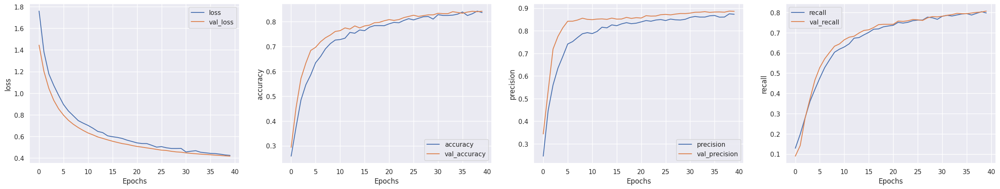

In [ ]:
plot_history(history_mobilenet)

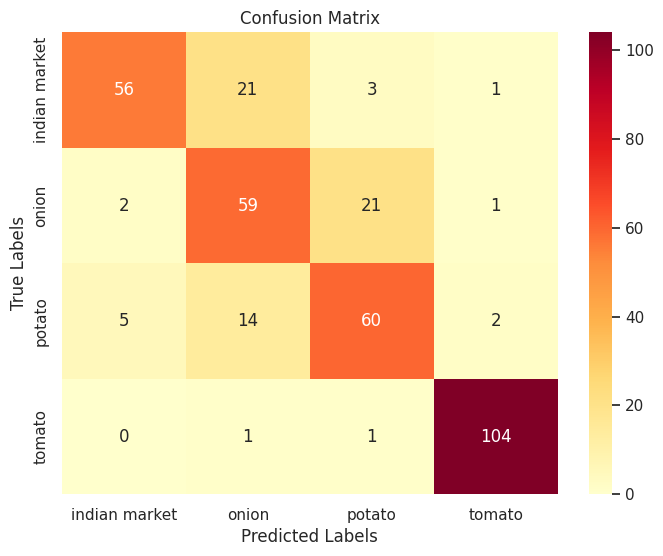

In [ ]:
actual_labels, predicted_labels, confusion_mat = plot_confusionmatrix(test_images, model_mobilenet)

In [ ]:
# Loss & Other Metrics from Test Dataset evaluation
result = model_mobilenet.evaluate(test_dataset)
dict(zip(model.metrics_names,np.round(result,3)))

11/11 [==============================] - 2s 71ms/step - loss: 0.5488 - accuracy: 0.7778 - precision: 0.8148 - recall: 0.7521


{'loss': 0.549, 'accuracy': 0.778, 'precision': 0.815, 'recall': 0.752}

# Comparision of all Models & Insights

### Models and their respective metrics on Test Dataset

| Model_name | # Parameters | #Trainable Parameters | Avg. prediction time (/step) | Loss | Accuracy | Precision | Recall |
| --- | --- |--- |--- |--- | --- | --- | --- |
| Custom CNN Model | 140K | 140K | 221 ms |  0.568 | 0.744 | 0.767 | 0.692 |
| FineTuned CNN Model | 140K | 140K | 67 ms |  0.311 | 0.895 | 0.919 | 0.877 |
| VGG19 Model | 20M | 2K | 208 ms |  0.632 | 0.877 | 0.877 | 0.875 |
| ResNet152 Model | 58M | 8K | 416 ms | 0.309 | 0.912 | 0.911 | 0.903 | 
| MobileNet | 3M | 4K| 71 ms | 0.549 | 0.778 | 0.815 | 0.752|

  



> If there are no constraints on Runtime execution time, best option is to use **ResNET152 Model** as it has **highest accuracy of 91.2%**.

> If there are constraints on Runtime execution time, best option is to use **Finetuned CNN Model** as it **good accuracy of 89.5% with average Prediction time of 67ms** 

## Picking Best Model & Checking Predictions from Model

In [6]:
#Picking the best Model : ResNet152
best_model = model_resnet152

#Compiling Model and loading saved weights
adam_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
best_model.compile(optimizer=adam_optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy', 'Precision', 'Recall'])

best_model.load_weights("C:\\Users\\z003u8jb\\Jupyter Notebooks\\Ninjacart CV Classification\\resnet152_best.h5")


In [15]:
# Set the paths and class labels
train_folder_path = "C:\\Users\\z003u8jb\\Jupyter Notebooks\\Ninjacart CV Classification\\ninjacart_data\\train"
test_folder_path = "C:\\Users\\z003u8jb\\Jupyter Notebooks\\Ninjacart CV Classification\\ninjacart_data\\test"

In [12]:
#Creating List with all Test Images location
test_images = []
for folder in os.listdir(test_folder_path):
    for image in os.listdir(test_folder_path + '\\'+ folder):
        test_images.append(os.path.join(test_folder_path,folder, image))

----------------------------------------------------------------------------------------------------
Predicting Labels for images from Test Dataset with their respective Class Label Probabilities
----------------------------------------------------------------------------------------------------


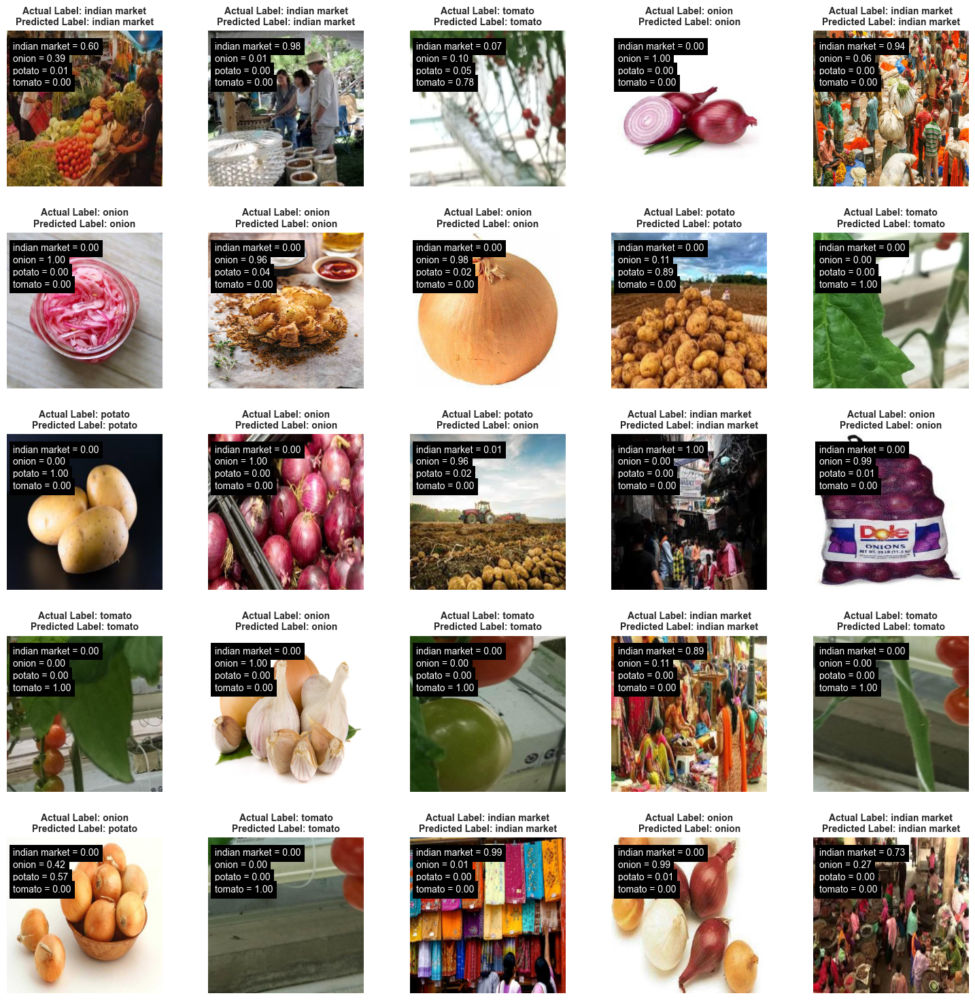

In [19]:
test_folder, class_labels = test_folder_path, test_class_names


# Create a figure for the grid display of Model Prediction

print("-"*100)
print('Predicting Labels for images from Test Dataset with their respective Class Label Probabilities')
print("-"*100)


fig, axes = plt.subplots(5, 5, figsize=(15, 15))
fig.tight_layout()
for i in range(25):
    x = np.random.randint(len(test_images))
    actual_label = test_images[x].split('\\')[-2]

    img_0 = tf.keras.utils.load_img(test_images[x])
    img_0 = tf.keras.utils.img_to_array(img_0)
    img_0 = tf.image.resize(img_0, (256,256))
    img_1 = tf.expand_dims(img_0, axis = 0)

    predictions = best_model.predict(img_1, verbose=0)
    predicted_label_index = np.argmax(predictions)
    predicted_label = class_labels[predicted_label_index]
    probabilities = predictions[0].round(3)

    # Display the image and predicted label with probabilities
    ax = axes[i % 5, i // 5]
    ax.imshow(img_0/255.0)
    ax.set_title('Actual Label: {}\nPredicted Label: {}'.format(actual_label, predicted_label),
                 fontsize = 10, fontweight = 'bold')
    ax.axis('off')

    # Display the probabilities as text
    for k, (class_label, probability) in enumerate(zip(class_labels, probabilities)):
        text = '{} = {:.2f}'.format(class_label, probability)
        ax.text(10, 30 + k*20, text, color='white', fontsize=10, bbox=dict(facecolor='black', edgecolor='none'))

plt.show()


> From 25 random predictions, the **Model is predicting 23 cases correctly & 2 cases incorrectly (> 90% Accuracy)**.

> In images choosen, the model is **slightly confused between Onion & Potatoes**. This happen same **image has multiple potatoes or Onions in same image**. In such cases it is actually difficult to differentiate between the two classes.


# --------------------------------------   END ---------------------------------------------